In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv("Data/Real-Data/Real_Combine.csv")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 737 entries, 0 to 736
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   T       737 non-null    float64
 1   TM      737 non-null    float64
 2   Tm      737 non-null    float64
 3   H       737 non-null    float64
 4   VV      737 non-null    float64
 5   V       737 non-null    float64
 6   VM      737 non-null    float64
 7   PM 2.5  736 non-null    float64
dtypes: float64(8)
memory usage: 46.2 KB


In [4]:
df.head()

,T,TM,Tm,H,VV,V,VM,PM 2.5
0,23.4,30.3,19.0,59.0,6.3,4.3,5.4,284.795833
1,22.4,30.3,16.9,57.0,6.9,3.3,7.6,219.720833
2,24.0,31.8,16.9,51.0,6.9,2.8,5.4,182.187500
3,22.8,30.2,17.6,55.0,7.7,3.7,7.6,154.037500
4,23.1,30.6,17.4,46.0,6.9,3.3,5.4,223.208333


In [5]:
# Check for null values
df.isnull().sum()

T         0
TM        0
Tm        0
H         0
VV        0
V         0
VM        0
PM 2.5    1
dtype: int64

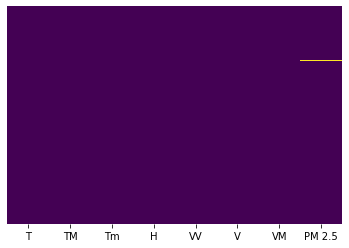

In [6]:
# Check for null values using heatmap
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [7]:
df = df.dropna()

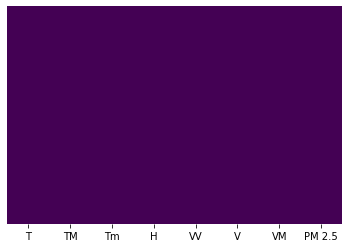

In [8]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis');

In [9]:
X = df.iloc[:,:-1] # dependant variables 
y = df.iloc[:,-1]

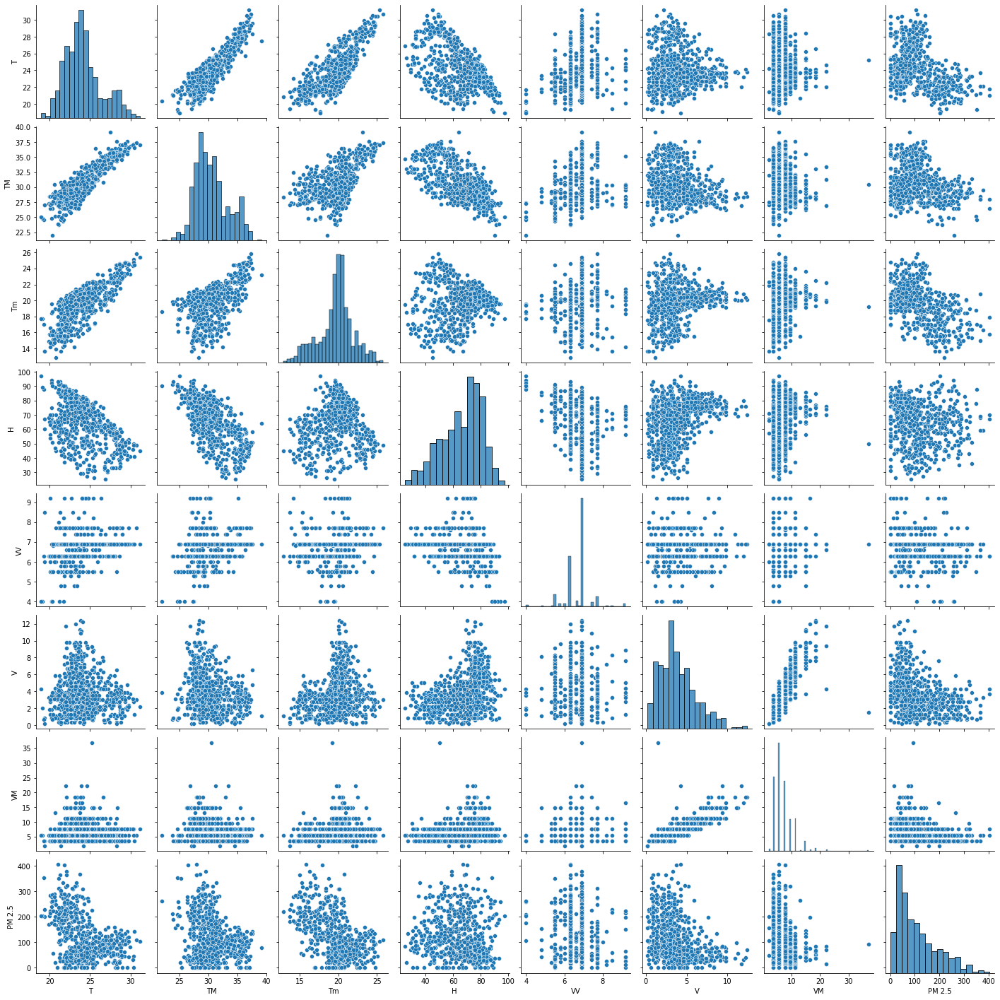

In [10]:
sns.pairplot(df)

In [11]:
#pd.plotting.scatter_matrix(X, figsize=(15, 10) , marker='.'); 

In [12]:
df.corr()

,T,TM,Tm,H,VV,V,VM,PM 2.5
T,1.000000,0.882433,0.772471,-0.479727,0.298138,-0.060587,-0.022747,-0.370754
TM,0.882433,1.000000,0.512705,-0.659010,0.275448,-0.233228,-0.160021,-0.194339
Tm,0.772471,0.512705,1.000000,0.101630,0.102964,0.217269,0.196513,-0.519450
H,-0.479727,-0.659010,0.101630,1.000000,-0.282130,0.380803,0.299179,-0.189129
VV,0.298138,0.275448,0.102964,-0.282130,1.000000,0.020445,0.007957,-0.138311
V,-0.060587,-0.233228,0.217269,0.380803,0.020445,1.000000,0.792492,-0.402463
VM,-0.022747,-0.160021,0.196513,0.299179,0.007957,0.792492,1.000000,-0.339834
PM 2.5,-0.370754,-0.194339,-0.519450,-0.189129,-0.138311,-0.402463,-0.339834,1.000000


In [13]:
df.corr()['PM 2.5'] 

T        -0.370754
TM       -0.194339
Tm       -0.519450
H        -0.189129
VV       -0.138311
V        -0.402463
VM       -0.339834
PM 2.5    1.000000
Name: PM 2.5, dtype: float64

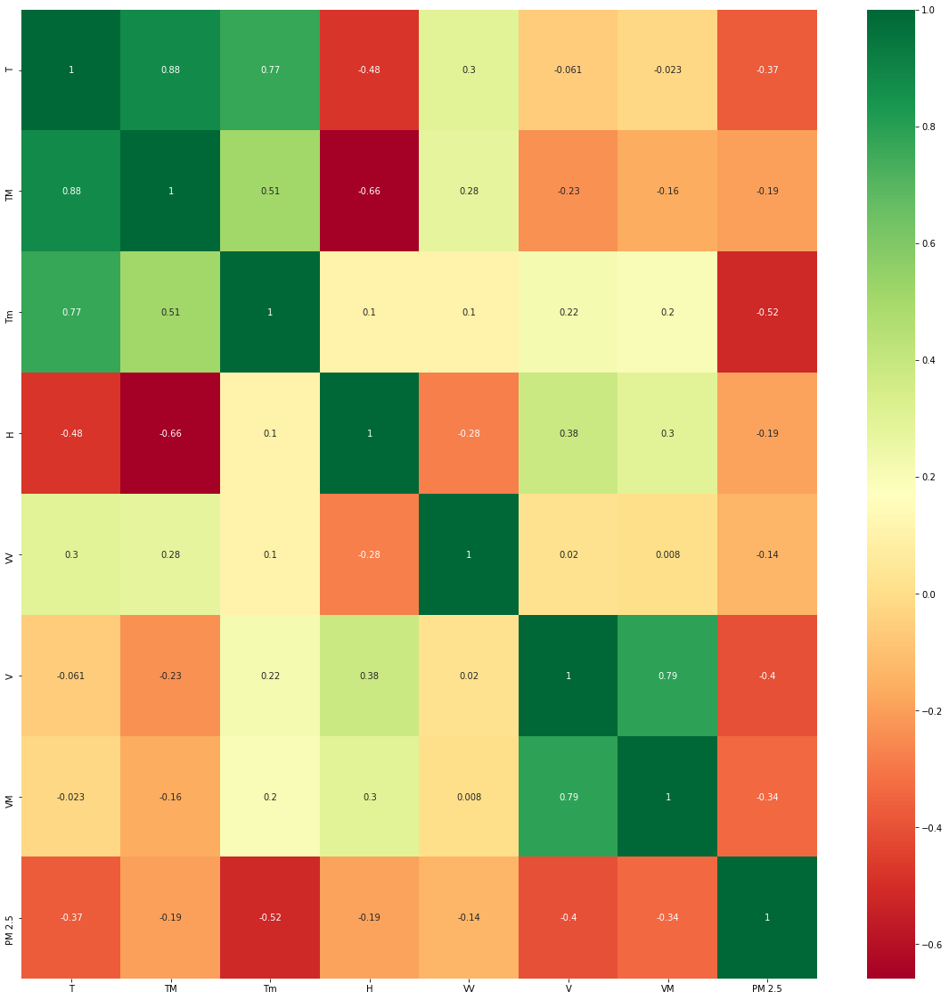

In [14]:
corrmat = df.corr()
feature = corrmat.index
plt.figure(figsize=(20,20))
sns.heatmap(df[feature].corr(),annot=True,cmap='RdYlGn');

In [15]:
feature

Index(['T', 'TM', 'Tm', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

#### Feature Importance

In [16]:
from sklearn.ensemble import ExtraTreesRegressor
model = ExtraTreesRegressor()
model.fit(X,y)

ExtraTreesRegressor()

In [17]:
X.head()

,T,TM,Tm,H,VV,V,VM
0,23.4,30.3,19.0,59.0,6.3,4.3,5.4
1,22.4,30.3,16.9,57.0,6.9,3.3,7.6
2,24.0,31.8,16.9,51.0,6.9,2.8,5.4
3,22.8,30.2,17.6,55.0,7.7,3.7,7.6
4,23.1,30.6,17.4,46.0,6.9,3.3,5.4


In [18]:
print(model.feature_importances_)

[0.18895372 0.11994966 0.27582142 0.10589396 0.07100339 0.15444387
 0.08393398]


In [19]:
feature_importences = pd.Series(model.feature_importances_,index=X.columns)

In [20]:
feature_importences

T     0.188954
TM    0.119950
Tm    0.275821
H     0.105894
VV    0.071003
V     0.154444
VM    0.083934
dtype: float64

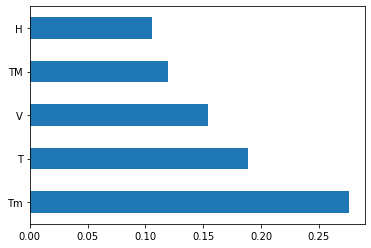

In [21]:
feature_importences.nlargest(5).plot(kind='barh')
plt.show();

D:\Anaconda3\envs\ML\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


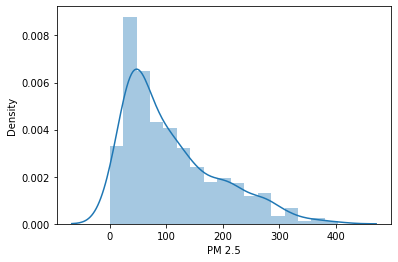

In [22]:
sns.distplot(y);

In [23]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=35)

In [24]:
from sklearn.tree import DecisionTreeRegressor

In [25]:
dtree = DecisionTreeRegressor(criterion='mse')

In [26]:
dtree.fit(X_train,y_train)

DecisionTreeRegressor()

In [27]:
print('R^2 score: ',dtree.score(X_train,y_train))

R^2 score:  1.0


In [28]:
print('R^2 score: ',dtree.score(X_test,y_test))

R^2 score:  -0.030554340767701582


In [29]:
from sklearn.model_selection import cross_val_score

In [30]:
score = cross_val_score(dtree,X,y,cv=5)
np.mean(score)

-0.2768277320607352

In [32]:
from IPython.display import Image

In [36]:
from six import StringIO

In [37]:
from sklearn.tree import export_graphviz

In [38]:
import pydotplus

In [44]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'H', 'VV', 'V', 'VM']

In [41]:
import os

In [42]:
os.environ['Path'] = os.environ['Path']+ ';'+ os.environ['CONDA_PREFIX']+r"\library\bin\graphviz"

In [45]:
dotData = StringIO()
export_graphviz(dtree,out_file=dotData,feature_names=features,filled=True,rounded=True)
graph = pydotplus.graph_from_dot_data(dotData.getvalue())
Image(graph.create_png())

In [46]:
prediction = dtree.predict(X_test)

D:\Anaconda3\envs\ML\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


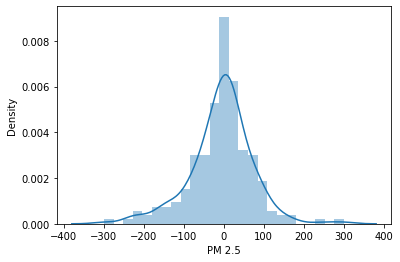

In [47]:
sns.distplot(y_test-prediction);

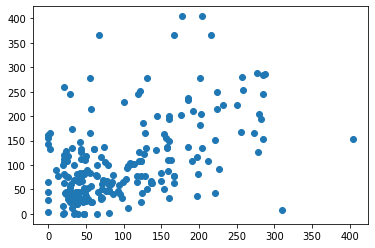

In [48]:
plt.scatter(y_test,prediction);

### Hyperparameter Tunning

In [ ]:
DecisionTreeRegressor()

In [49]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [51]:
params = {
    'splitter':['best','random'],
    'max_depth':[3,4,5,7,8,10,15,20],
    'min_samples_leaf':[1,2,3,4,5],
    'max_features':['auto','log2','sqrt',None],
    'max_leaf_nodes':[None,10,20,30,40,50,60,70],   
}

In [52]:
params

{'splitter': ['best', 'random'],
 'max_depth': [3, 4, 5, 7, 8, 10, 15, 20],
 'min_samples_leaf': [1, 2, 3, 4, 5],
 'max_features': ['auto', 'log2', 'sqrt', None],
 'max_leaf_nodes': [None, 10, 20, 30, 40, 50, 60, 70]}

In [54]:
random_search=GridSearchCV(dtree,param_grid=params,scoring='neg_mean_squared_error',cv=10,verbose=3,n_jobs=-1)

In [55]:
random_search.fit(X,y)

Fitting 10 folds for each of 2560 candidates, totalling 25600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   16.4s
[Parallel(n_jobs=-1)]: Done 344 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done 1624 tasks      | elapsed:   21.2s
[Parallel(n_jobs=-1)]: Done 3416 tasks      | elapsed:   25.9s
[Parallel(n_jobs=-1)]: Done 5720 tasks      | elapsed:   32.0s
[Parallel(n_jobs=-1)]: Done 8536 tasks      | elapsed:   40.4s
[Parallel(n_jobs=-1)]: Done 11864 tasks      | elapsed:   49.5s
[Parallel(n_jobs=-1)]: Done 15704 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 20056 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 24920 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 25600 out of 25600 | elapsed:  1.5min finished


GridSearchCV(cv=10, estimator=DecisionTreeRegressor(), n_jobs=-1,
             param_grid={'max_depth': [3, 4, 5, 7, 8, 10, 15, 20],
                         'max_features': ['auto', 'log2', 'sqrt', None],
                         'max_leaf_nodes': [None, 10, 20, 30, 40, 50, 60, 70],
                         'min_samples_leaf': [1, 2, 3, 4, 5],
                         'splitter': ['best', 'random']},
             scoring='neg_mean_squared_error', verbose=3)

In [56]:
random_search.best_params_

{'max_depth': 7,
 'max_features': 'auto',
 'max_leaf_nodes': 20,
 'min_samples_leaf': 5,
 'splitter': 'random'}

In [57]:
random_search.best_score_

-4231.485670258549

In [59]:
prediction2 = random_search.predict(X_test)

D:\Anaconda3\envs\ML\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


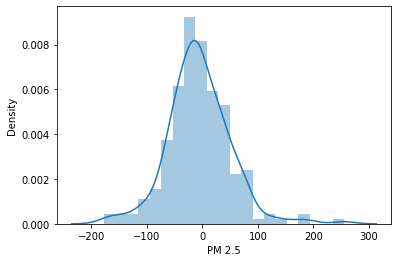

In [60]:
sns.distplot(y_test-prediction2);

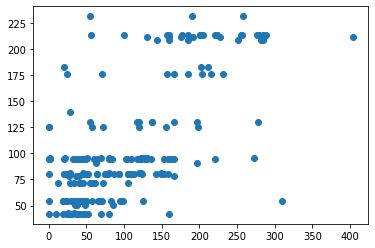

In [61]:
plt.scatter(y_test,prediction2);

In [63]:
from sklearn import metrics

In [64]:
print('MAE: ',metrics.mean_absolute_error(y_test,prediction2))
print('MSE: ',metrics.mean_squared_error(y_test,prediction2))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test,prediction2)))

MAE:  42.075358688575946
MSE:  3245.04654557945
RMSE:  56.96531001916386


In [65]:
import pickle

In [66]:
file = open('DicisionTreeRegression.pkl','wb')
pickle.dump(random_search,file)